#### Lab3 - Isolation Forest, LODA 

In this lab we will use anomaly detection algorithms like Isolation Forest and LODA.

In order to use **Deep Isolation Forest** model from **pyod** you have to install **pythorch**.

<center><code>pip install torch</code></center>

A few methods that will be usefull to you through this lab session are:

**sklearn.datasets.make_blobs** is used to generate isotropic Gaussaian clusters (covariance matrix can be represented in this form $\Sigma = \sigma^2 I$), its parameters include
- numbers of samples `n_samples=100`
- numbers of featuers `n_features=2`
- centers and standard deviation of the clusters `centers=None`, `cluster_std=1.0`
- bounding box for each cluster center when centers are generated at random: `center_box=(-10.0, 10.0)`
- `shuffle=True`
- `random_state=None`
- `return_centers=False`

**sklearn.model_selection.train_test_split** splits datasets into random train and test subsets and include the parameters:
- input data: *arrays
- test data and train data size: `test_size=None`, `train_size=None`
- `random_state=None`
- `shuffle=None`
- `satisfy=True` used to split in a stratified fashion

**sklearn.metrics.roc_auc_score** computes ROC AUC:
- true labels: `y_true`
- obtained scores: `y_scores`


**scipy.io.loadmat** loads data from MATLAB file and and includes the following parameters:
- `file_name`
- dictionary in which to insert matfile variables: `mdic=None`
- `appendmap=True`: to append the .mat externsion to the end of the given filename

**pyod.utils.utility.standardizer** transforms data to zero-mean and unit variance; it includes the parmeteres:
- training samples and test samples: `X, X_t= None`

**numpy.quantile** computes the q-th quantile of the data along the specified axis (the value below which the specified percentage of data fails); its parameters include:
- input array: a
- probability or sequence of probabilities of the quantiles to compute. Values must be between $0$ and $1$ inclusive: q

**numpy.random.uniform** draws samples from a uniform distribuition; its parameters include:
- lower boundary and upper boundary of the ouput interval1: low, high
- output shape: value

**numpy.histogram** computes the histogram of $1D$ dataset; its parameters include:
- input data: a
- number of equal-width bins in the given range (if it's an int) or a montonically increasing array of bin edges (it's a sequence)
- the lower and upper range of the bins

### IForest main ideas
Anomaly score:
$$
s(x, n) = 2^{\frac{-E(h(x))}{c(n)}}
$$

* $E(h(x))$ - average of $h(x)$ from all the iTrees of the IForests
* $c(n)$ - average path lenght of an iTree (average path lenght of unsuccessful search in BST)
* sub-sampling size $\psi = 256$ (height limit of $l = 8$) 
* the ensamble size $t = 100$

### 2. Exercises

#### 2.1 Ex. 1



1. In the first exerise you will design a simpler variant of LODA. First you will generate a $2D$ dataset that follows a standard normal distribuition (500 points) using **sklearn.datasets.make_blobs**.

X shape: (500, 2)


Text(0, 0.5, 'x2')

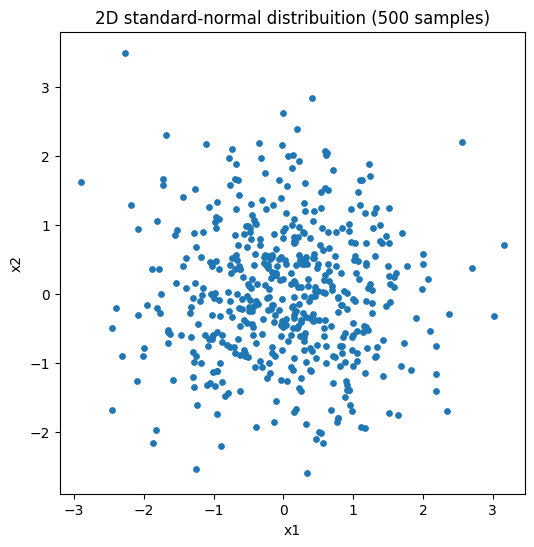

In [3]:
import matplotlib.pyplot as plt

from sklearn.datasets import make_blobs

X, Y = make_blobs(n_samples=500, n_features=2, centers=[[0, 0]], cluster_std=1.0, random_state=30)

print("X shape:", X.shape)

fig, ax = plt.subplots(figsize=(6, 6))
ax.scatter(X[:, 0], X[:, 1], s=15)
ax.set_title("2D standard-normal distribuition (500 samples)")
ax.set_xlabel("x1")
ax.set_ylabel("x2")

2. Then you will randomly generate $5$ unit-length projection vectors (you can use **numpy.random.multivariate_normal** with $(0, 0)$ mean and identity matrix as covariance matrix) that will be used to generate $1D$ histograms (for the projcted values). You will compute the coresponding histograms with equal-width bins using **numpy.histogram** (for the **range** parameter use a larger interval than the range of the projected values). For each histogram compute the probability corresponding to each bin and use them to compute the anomaly score of a sample as the mean of the probabilities (corresponding to each histogram).

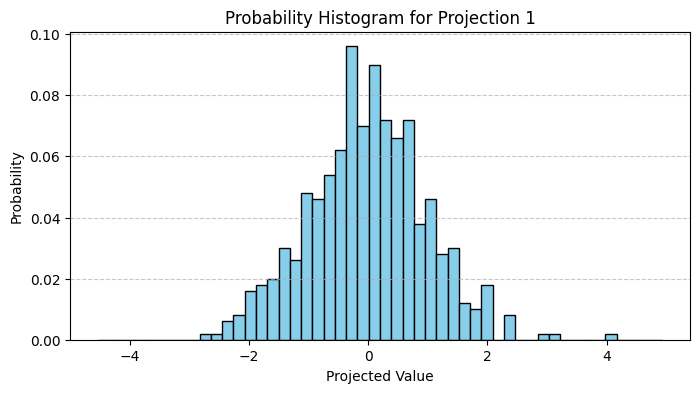

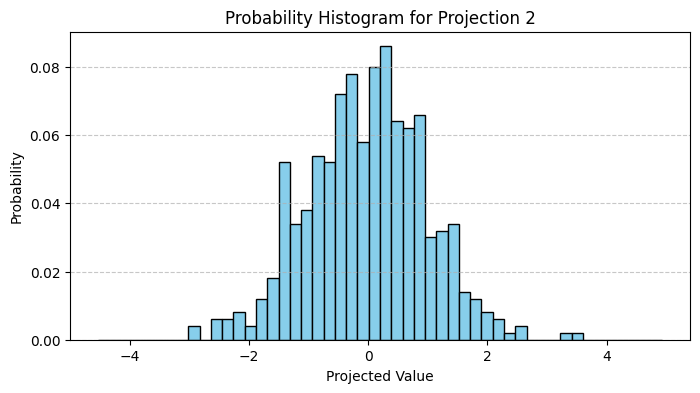

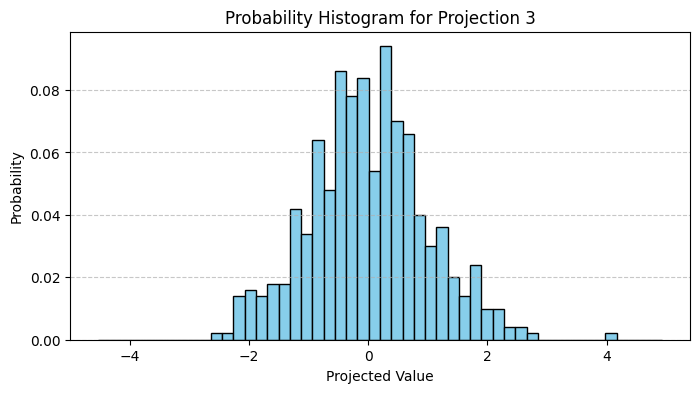

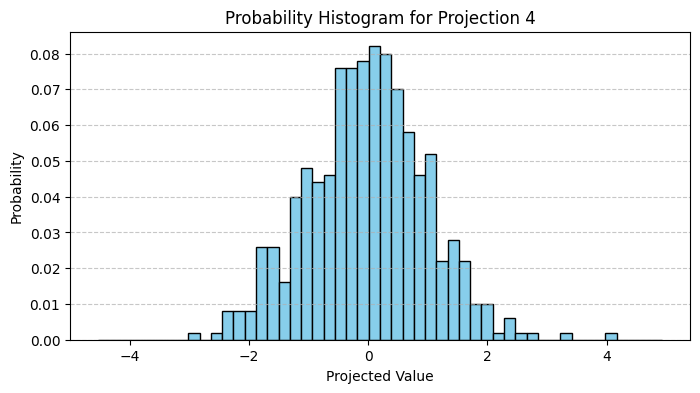

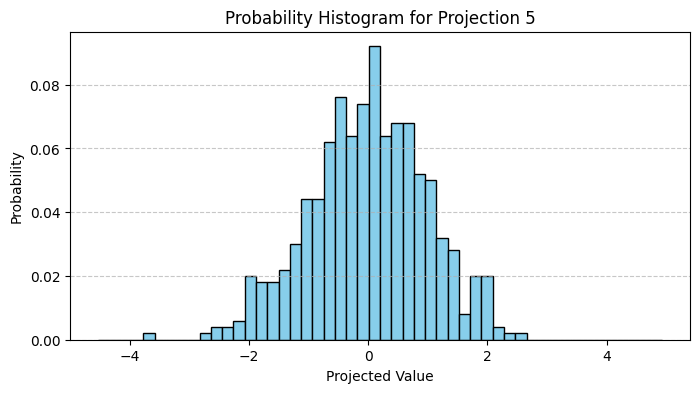

Anomaly shape: (500,)
Probabilities shape: (5, 50)
Top 10 anomaly scores: [4.52820914 4.64599217 4.64599217 4.77952356 4.99083265 5.11599579
 5.11599579 5.11599579 5.87813583 6.21460805]


In [4]:
import numpy as np
import matplotlib.pyplot as plt

def train_lambda(X, n_projections=5, n_bins=50, plot_histograms=False):
    np.random.seed(30)
    vectors = np.random.multivariate_normal(mean=[0, 0], cov=np.eye(2), size=n_projections)

    vectors = vectors / np.linalg.norm(vectors, axis=1, keepdims=True) # normalize them all at once

    train_projections = X @ vectors.T

    pmin, pmax = train_projections.min(), train_projections.max()
    margin = 0.1 * (pmax - pmin)
    hist_range = (pmin - margin, pmax + margin)

    n_samples = X.shape[0]
    projection_histogram = []
    projection_bin_edges = []

    per_proj_probs = np.zeros((n_samples, n_projections))
    for i in range(n_projections):
        proj = train_projections[:, i]

        counts, bin_edges = np.histogram(proj, bins=n_bins, range=hist_range)
        probs = counts / counts.sum()

        projection_histogram.append(counts)
        projection_bin_edges.append(bin_edges)

        if plot_histograms:
            bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2.0
            bin_width = bin_edges[1] - bin_edges[0]

            plt.figure(figsize=(8, 4))
            plt.bar(bin_centers, probs, width=bin_width, color='skyblue', edgecolor='black')
            plt.title(f"Probability Histogram for Projection {i+1}")
            plt.xlabel("Projected Value")
            plt.ylabel("Probability")
            plt.grid(axis='y', linestyle='--', alpha=0.7)
            plt.show()

        # find bin indices for each projected value
        bin_idx = np.digitize(proj, bin_edges) - 1
        bin_idx = np.clip(bin_idx, 0, n_bins - 1)

        # assign probability for each sample for this projection
        per_proj_probs[:, i] = probs[bin_idx]


    projection_histogram = np.array(projection_histogram)
    projection_bin_edges = np.array(projection_bin_edges)

    epsilon = 1e-10
    normality_scores = per_proj_probs.mean(axis=1)
    anomaly_score_test = -np.log(normality_scores + epsilon)

    print("Anomaly shape:", anomaly_score_test.shape)
    print("Probabilities shape:", projection_histogram.shape)
    print("Top 10 anomaly scores:", np.sort(anomaly_score_test)[-10:])


    return {
        "vectors": vectors,
        "histograms": projection_histogram,
        "bin_edges": projection_bin_edges,
    }

model = train_lambda(X, n_projections=5, n_bins=50, plot_histograms=True)

3. For testing, generate a dataset with $500$ points from a uniform distribution (between $-3$ and $3$ using **np.random.uniform**). Plot the points in the test dataset using a colormap (related to the anomaly scores).

In [5]:
np.random.seed(30)
n_test = 500
X_test = np.random.uniform(-3, 3, size=(n_test, 2))

def gen_histogram(n_bins):
    model = train_lambda(X, n_projections=5, n_bins=n_bins, plot_histograms=False)
    vectors, probabilities, bin_edges_list = model["vectors"], model["histograms"], model["bin_edges"]
    test_projections = X_test @ vectors.T

    n_projections = vectors.shape[0]
    per_proj_probs_test = np.zeros((X_test.shape[0], n_projections))
    for i in range(n_projections):
        test_proj = test_projections[:, i]
        bin_edges = bin_edges_list[i]
        hist_probs = probabilities[i]

        bin_indices = np.digitize(test_proj, bin_edges) - 1
        bin_indices = np.clip(bin_indices, 0, n_bins - 1)
        per_proj_probs_test[:, i] = hist_probs[bin_indices]

    epsilon = 1e-10
    normality_score_test = per_proj_probs_test.mean(axis=1)
    anomaly_score_test = -np.log(normality_score_test + epsilon)

    fig_test, ax_test = plt.subplots(figsize=(8, 6))
    sc_test = ax_test.scatter(X_test[:, 0], X_test[:, 1], c=anomaly_score_test, cmap="viridis", s=20)
    ax_test.set_title("Anomaly score (higher = more anomalous), bins="+str(n_bins))
    ax_test.set_xlabel("x1")
    ax_test.set_ylabel("x2")
    ax_test.axis("equal")
    plt.colorbar(sc_test, ax=ax_test, label="anomaly score")
    plt.show()

4. Use different number of bins and see how this affects the results.

Anomaly shape: (500,)
Probabilities shape: (5, 2)
Top 10 anomaly scores: [0.80474936 0.80474936 0.80474936 0.80474936 0.80474936 0.80474936
 0.80474936 0.80474936 0.80474936 0.80474936]


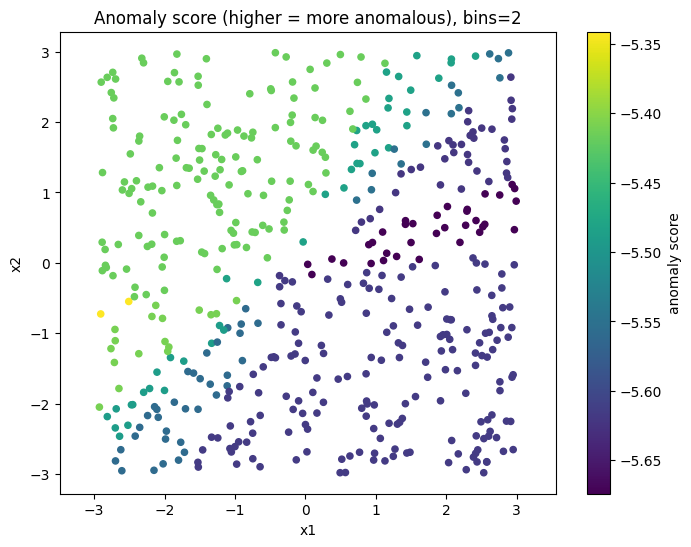

Anomaly shape: (500,)
Probabilities shape: (5, 5)
Top 10 anomaly scores: [2.02798826 2.02798826 2.02798826 2.02798826 2.02798826 2.02798826
 2.02798826 2.66499071 2.67075441 5.62682141]


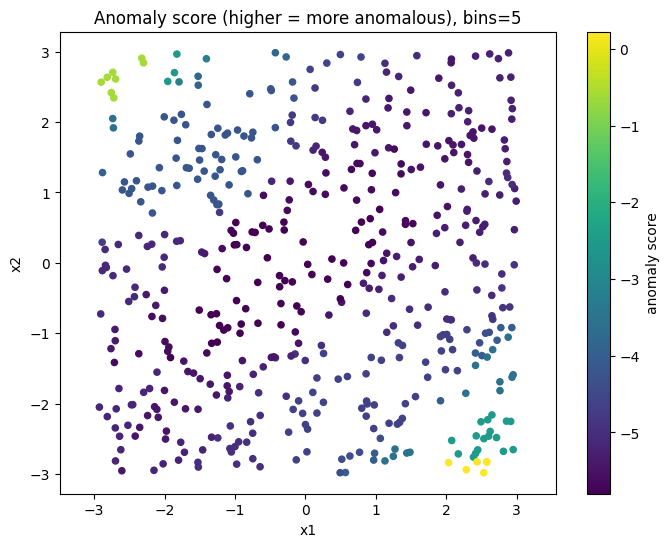

Anomaly shape: (500,)
Probabilities shape: (5, 10)
Top 10 anomaly scores: [2.83361342 2.83361342 2.83361342 3.24933503 3.27016912 3.41732676
 3.85375409 3.85375409 4.13516655 6.0322865 ]


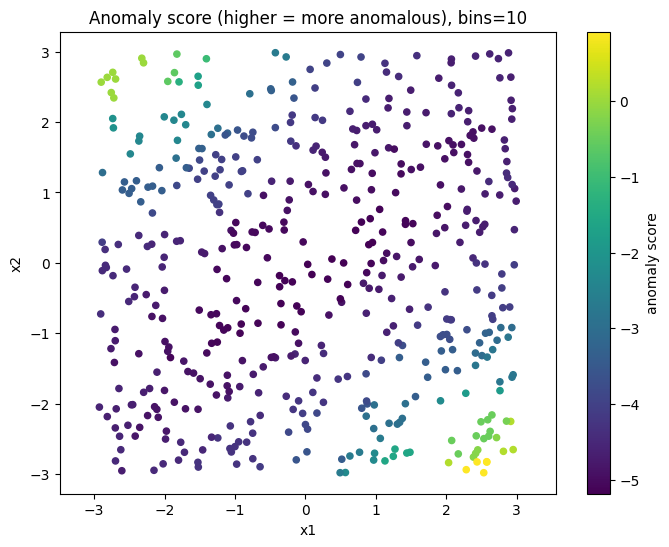

Anomaly shape: (500,)
Probabilities shape: (5, 50)
Top 10 anomaly scores: [4.52820914 4.64599217 4.64599217 4.77952356 4.99083265 5.11599579
 5.11599579 5.11599579 5.87813583 6.21460805]


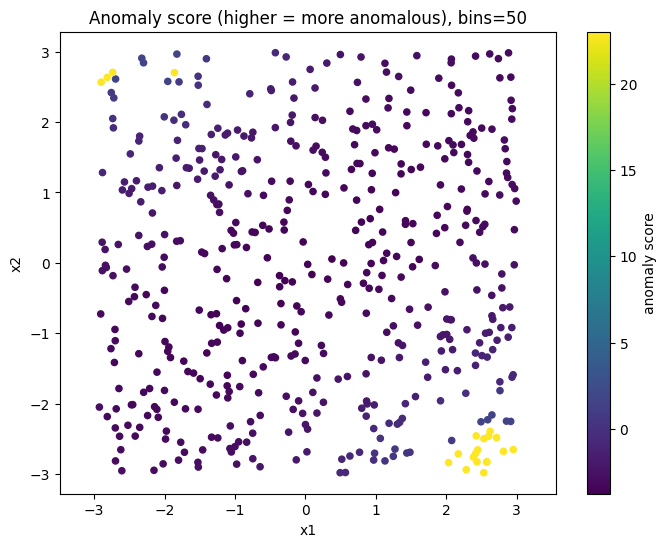

Anomaly shape: (500,)
Probabilities shape: (5, 100)
Top 10 anomaly scores: [5.11599579 5.18498866 5.25909663 5.42615072 5.42615072 5.42615072
 5.52146089 5.52146089 6.0322865  6.21460805]


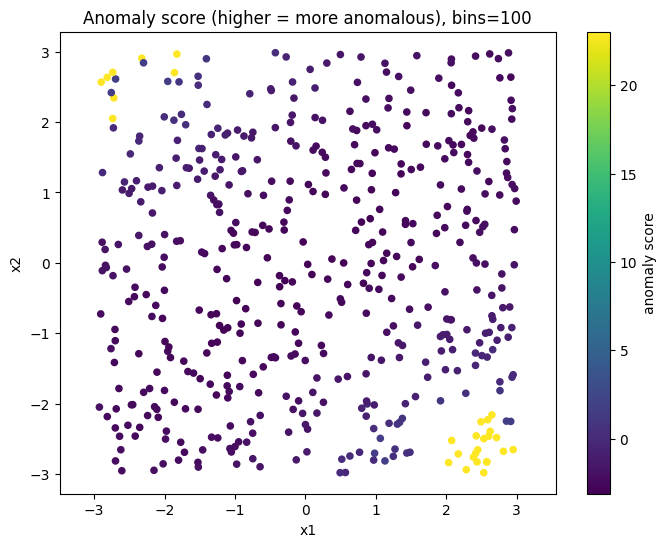

In [110]:
n_bins = [2, 5, 10, 50, 100]
for bins in n_bins:
    gen_histogram(bins)

Bins in range: $2-5$
- many projection fall into the same bin
- outliers are hard to separate because the bin resolution is low

Bins in range: $10-50$
- better resolution of the bins
- outliers are better separated

Bins in range: $100$
- very high resolution of the bins
- results become unstable and dominated by sampling noise


#### 2.2 Ex. 2

1. In this exercise we will try to see how the standard Isolation Forest algorithm introduces some artifacts when computing the anomaly scores. You will generate 2 clusters of 2-dimensional data using make blobs() function. The 2 clusters will have $(10, 0)$ and $(0, 10)$ as centers, 1 as standard deviation and 500 samples each.

X_if shape: (1000, 2) y_if shape: (1000,)


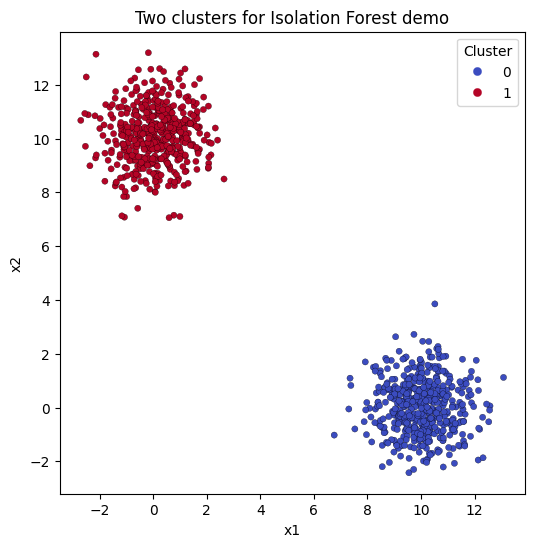

In [ ]:
X_if, y_if = make_blobs(n_samples=[500, 500],
                        n_features=2,
                        centers=[[10, 0], [0, 10]],
                        cluster_std=1.0,
                        random_state=42,
                        shuffle=True)

print("X_if shape:", X_if.shape, "y_if shape:", y_if.shape)

fig, ax = plt.subplots(figsize=(6, 6))
sc = ax.scatter(X_if[:, 0], X_if[:, 1], c=y_if, cmap="coolwarm", s=20, edgecolor="k", linewidth=0.2)
ax.set_title("Two clusters for Isolation Forest demo")
ax.set_xlabel("x1")
ax.set_ylabel("x2")
ax.legend(*sc.legend_elements(), title="Cluster")
plt.show()

2. You will fit an **IForest** model (from **pyod.models.iforest**) using this data (and a contamination rate of $0.1$). Test data will be generated from a uniform distribution over the interval $(-10, 20)$ using **np.random.uniform** and will contain $1000$ samples.

In [12]:
from pyod.models.iforest import IForest

clf = IForest(contamination=0.1, random_state=30)
clf.fit(X_if)

# generate uniform test data in (-10, 20)
X_test_if = np.random.uniform(-10, 20, size=(1000, 2))

# score test points (higher = more anomalous)
scores_if = clf.decision_function(X_test_if)

# mark top 10% as anomalies (based on contamination)
threshold = np.percentile(scores_if, 90)
is_anomaly = scores_if >= threshold

print("scores shape:", scores_if.shape)
print("anomalies (top 10%) count:", int(is_anomaly.sum()))

scores shape: (1000,)
anomalies (top 10%) count: 118


3. Find the anomaly scores for the test data and plot the samples using a colormap (related to the anomaly scores). Observe the arefacts introduced by the axis-parallel separating hyperplans used by standard IForest.

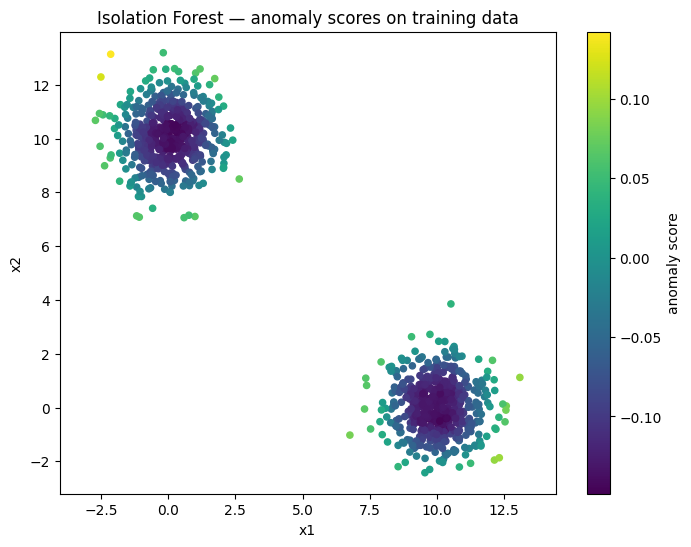

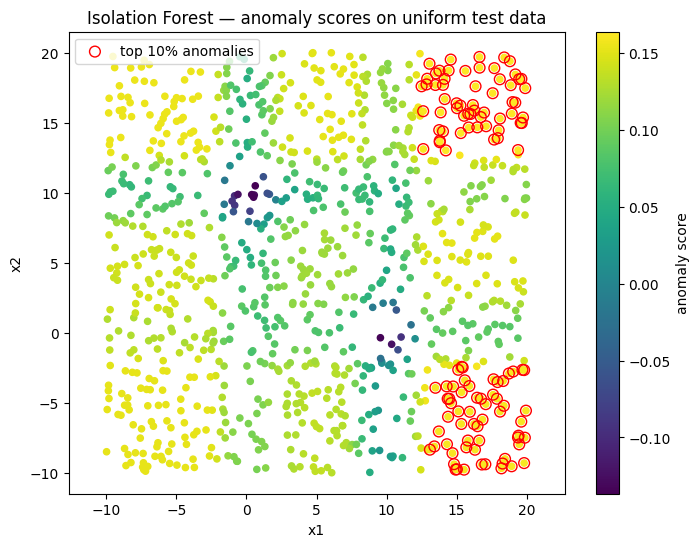

In [13]:
#plot results train
fig_if_train, ax_if_train = plt.subplots(figsize=(8, 6))
sc_if_train = ax_if_train.scatter(X_if[:, 0], X_if[:, 1], c=clf.decision_function(X_if), cmap="viridis", s=20)
ax_if_train.set_title("Isolation Forest — anomaly scores on training data")
ax_if_train.set_xlabel("x1"); ax_if_train.set_ylabel("x2"); ax_if_train.axis("equal")
plt.colorbar(sc_if_train, ax=ax_if_train, label="anomaly score")
plt.show()

# plot results test
fig_if, ax_if = plt.subplots(figsize=(8, 6))
sc_if = ax_if.scatter(X_test_if[:, 0], X_test_if[:, 1], c=scores_if, cmap="viridis", s=20)
ax_if.scatter(X_test_if[is_anomaly, 0], X_test_if[is_anomaly, 1],
              facecolors='none', edgecolors='r', s=60, linewidth=1, label='top 10% anomalies')
ax_if.set_title("Isolation Forest — anomaly scores on uniform test data")
ax_if.set_xlabel("x1"); ax_if.set_ylabel("x2"); ax_if.axis("equal")
ax_if.legend()
plt.colorbar(sc_if, ax=ax_if, label="anomaly score")
plt.show()

Top 10% anomalies concentrate in rectangular corner regions (circled) instead of following circular/smooth density contours — an artifact of axis‑parallel splits.

Standard Isolation Forest splits features independently (random thresholds on one feature per node), so partition boundaries are axis‑parallel. That produces grid/stripe artifacts especially when:
- tree depth / number of splits is small,
- number of trees is limited,
- data has isotropic (rotationally symmetric) structure; axis-parallel cuts are a poor fit.

4. Repeat the same procedure for Deep Isolation Forest (**DIF** from **pyod.models.dif**) and **LODA** (from **pyod.models.loda**) and use 3 subplots for the the $3$ figures.

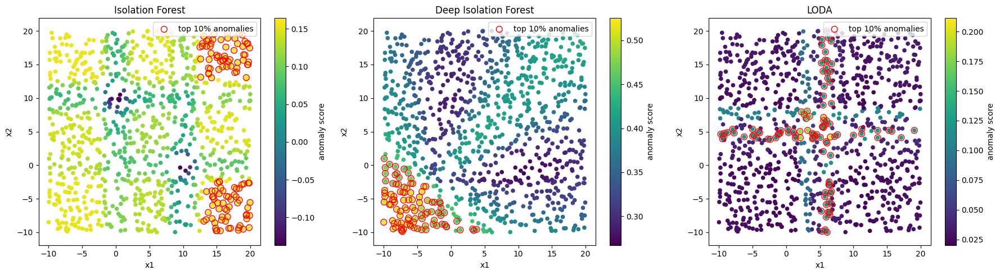

In [ ]:
import numpy as np

from pyod.models.dif import DIF
from pyod.models.loda import LODA

# train DIF
dif = DIF(contamination=0.1, random_state=30)
dif.fit(X_if)
scores_dif = dif.decision_function(X_test_if)

# train LODA
loda = LODA(contamination=0.1)
loda.fit(X_if)
scores_loda = loda.decision_function(X_test_if)

# plot 3 subplots side-by-side
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
models = [
    ("Isolation Forest", scores_if),
    ("Deep Isolation Forest", scores_dif),
    ("LODA", scores_loda),
]

for ax, (title, scores) in zip(axes, models):
    sc = ax.scatter(X_test_if[:, 0], X_test_if[:, 1], c=scores, cmap="viridis", s=20)

    thr = np.nanpercentile(scores, 90)
    mask_an = scores >= thr
    ax.scatter(X_test_if[mask_an, 0], X_test_if[mask_an, 1], facecolors='none', edgecolors='r', s=60, linewidth=1, label='top 10% anomalies')

    ax.set_title(title)
    ax.set_xlabel("x1"); ax.set_ylabel("x2"); ax.axis("equal")
    fig.colorbar(sc, ax=ax, label="anomaly score")
    ax.legend(loc='upper right')

plt.tight_layout()
plt.show()

5. Try different number of neurons for the hidden layers of **DIF** and different number of bins of **LODA**. Try to explain why the score maps for **LODA** look that way.

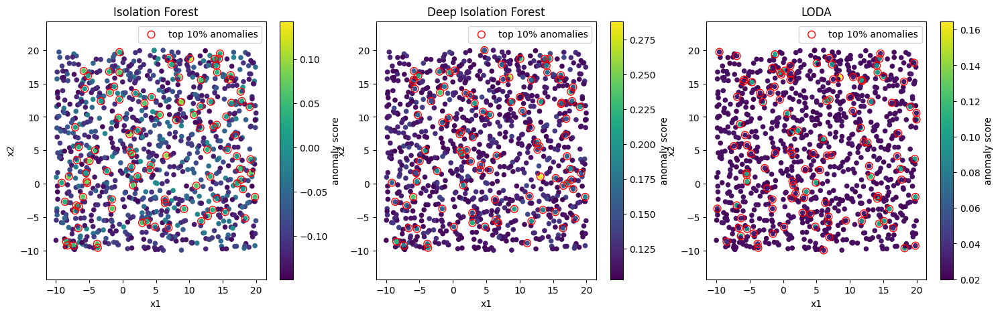

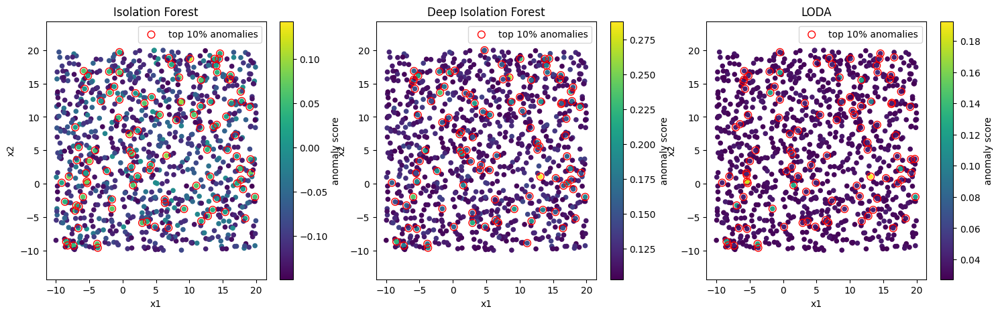

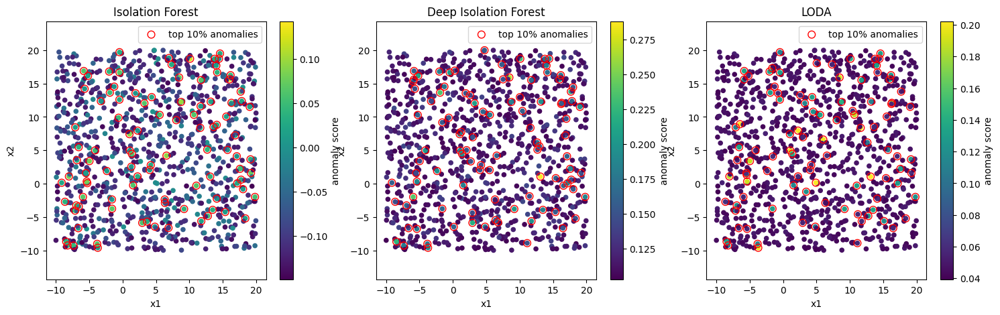

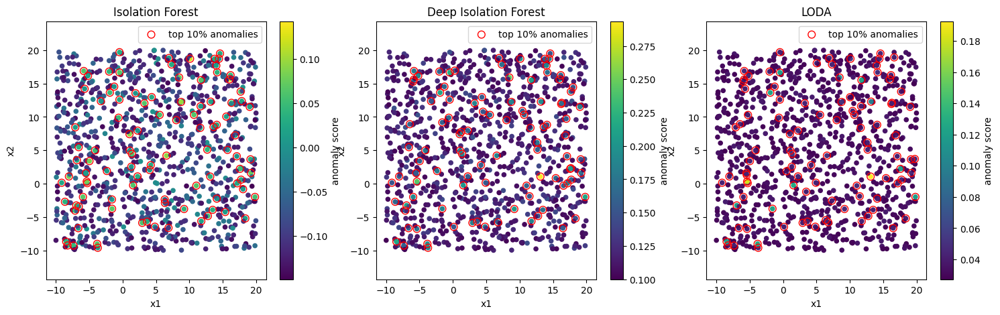

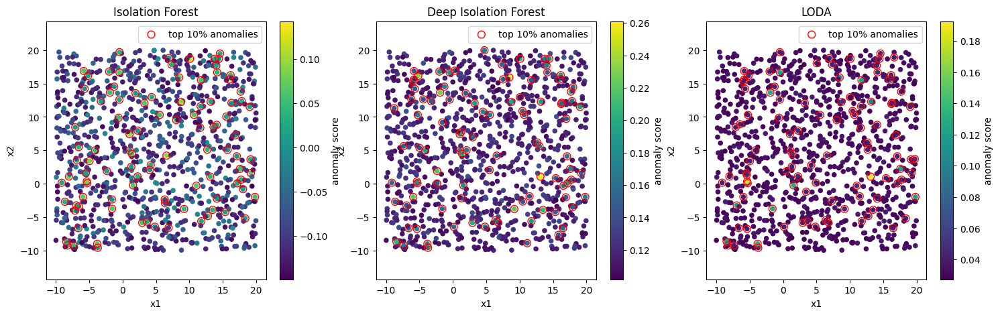

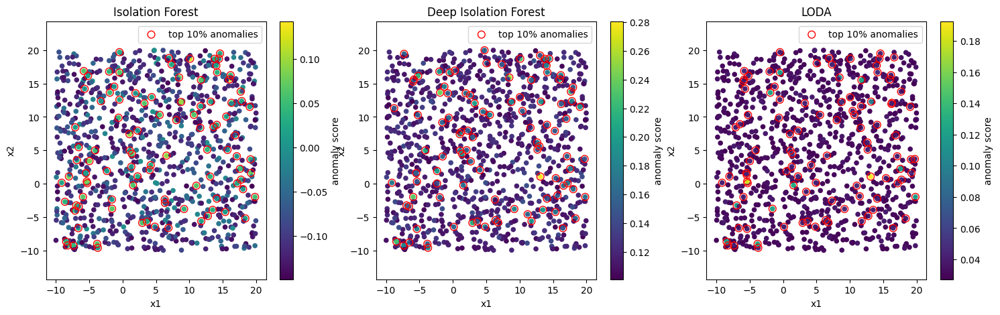

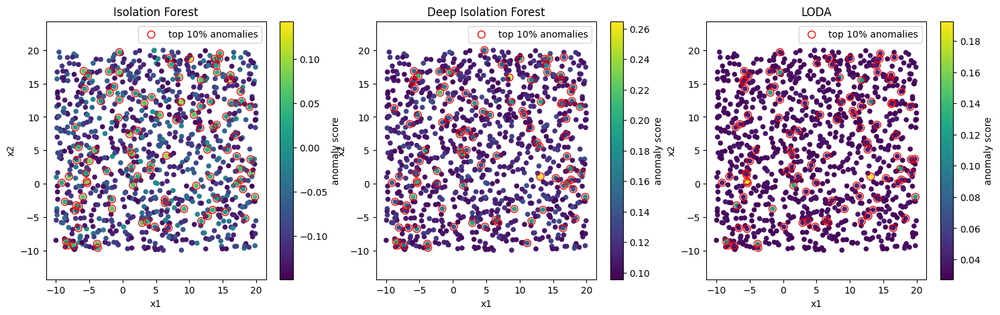

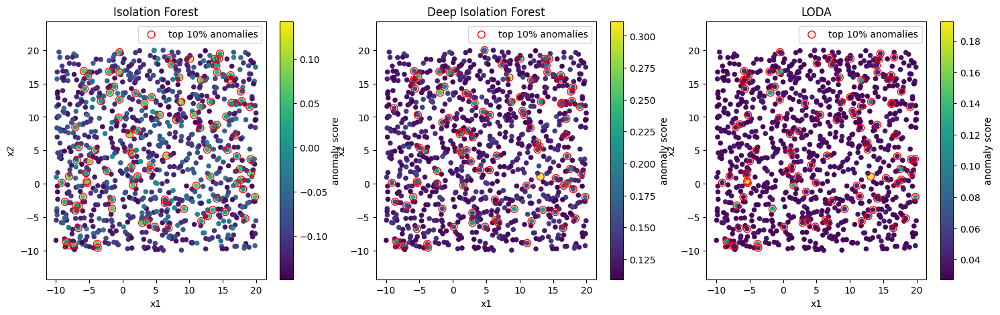

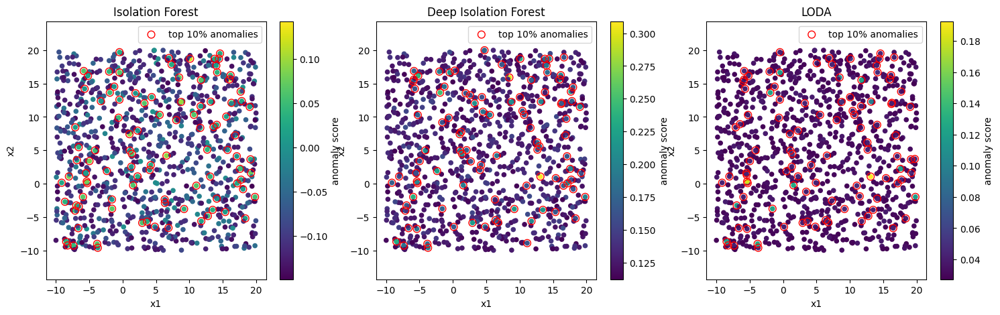

In [20]:
def train_models(X_train, neurons, nbins):
    # Isolation Forest
    clf = IForest(contamination=0.1, random_state=30)
    clf.fit(X_train)
    scores_if = clf.decision_function(X_train)

    # Deep Isolation Forest
    dif = DIF(contamination=0.1, random_state=30, hidden_neurons=neurons)
    dif.fit(X_train)
    scores_dif = dif.decision_function(X_train)

    # LODA
    loda = LODA(contamination=0.1, n_bins=nbins)
    loda.fit(X_train)
    scores_loda = loda.decision_function(X_train)

    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    models = [
        ("Isolation Forest", scores_if),
        ("Deep Isolation Forest", scores_dif),
        ("LODA", scores_loda),
    ]

    for ax, (title, scores) in zip(axes, models):
        sc = ax.scatter(X_test_if[:, 0], X_test_if[:, 1], c=scores, cmap="viridis", s=20)

        thr = np.nanpercentile(scores, 90)
        mask_an = scores >= thr
        ax.scatter(X_test_if[mask_an, 0], X_test_if[mask_an, 1], facecolors='none', edgecolors='r', s=60, linewidth=1, label='top 10% anomalies')

        ax.set_title(title)
        ax.set_xlabel("x1"); ax.set_ylabel("x2"); ax.axis("equal")
        fig.colorbar(sc, ax=ax, label="anomaly score")
        ax.legend(loc='upper right')

train_models(X_if, neurons=[20, 10], nbins=10) 
train_models(X_if, neurons=[20, 10], nbins=50)
train_models(X_if, neurons=[20, 10], nbins=200)

train_models(X_if, neurons=[20], nbins=50)
train_models(X_if, neurons=[20, 10, 5], nbins=50)
train_models(X_if, neurons=[50, 25, 10, 5], nbins=50)

train_models(X_if, neurons=[10, 5], nbins=50)
train_models(X_if, neurons=[50, 25], nbins=50)
train_models(X_if, neurons=[100, 50], nbins=50)

These experiments highlight two distinct tuning strategies. For LODA, the nbins parameter directly controls the resolution of its density-based score map in a trade-off between detail and computational cost. For Deep Isolation Forest, the network’s depth and width are architectural levers that control the complexity and dimensionality of its random data projections. By manipulating this architecture, DIF transforms the data into a new space where previously hidden, complex anomalies become much easier to isolate.

6. Redo all the steps in 3D (use $(0, 10, 0)$ and $(10, 0, 0)$ as centers of the clusters).

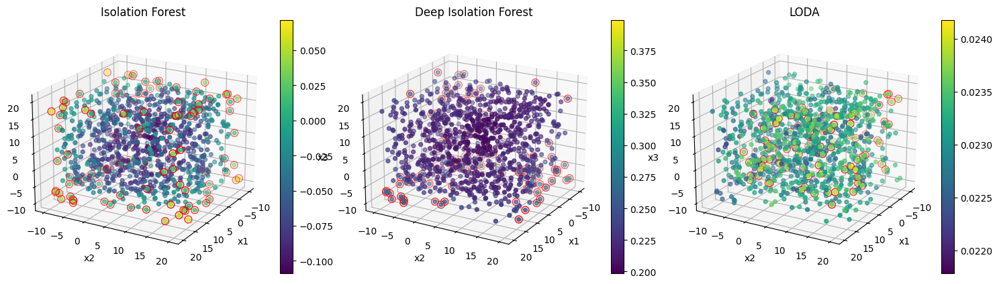

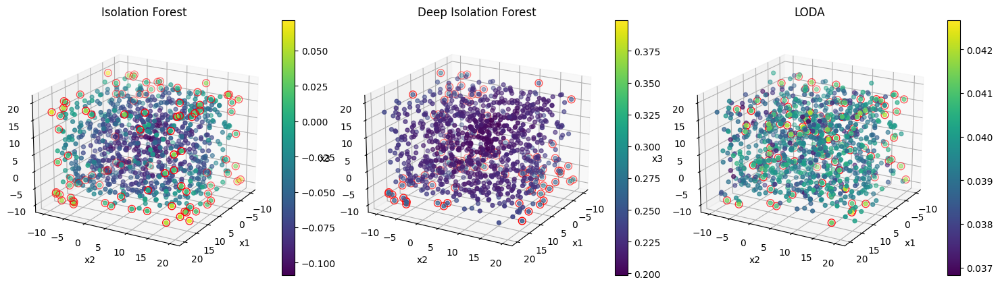

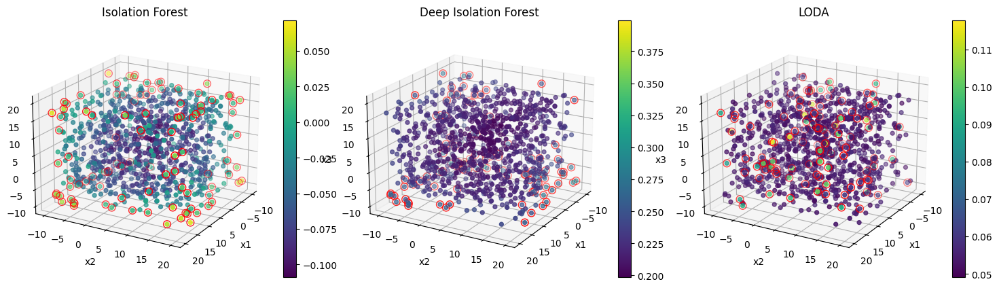

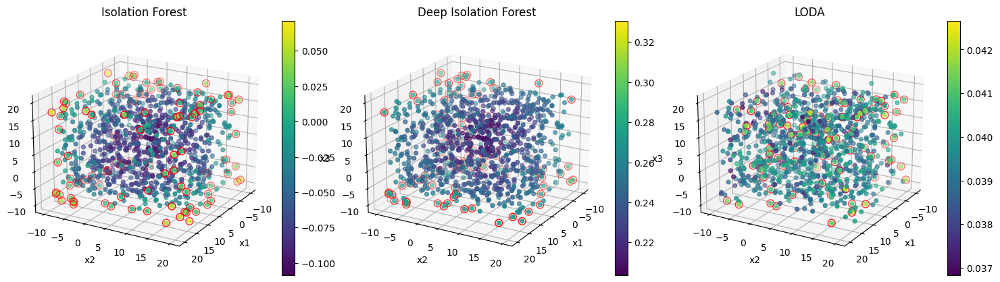

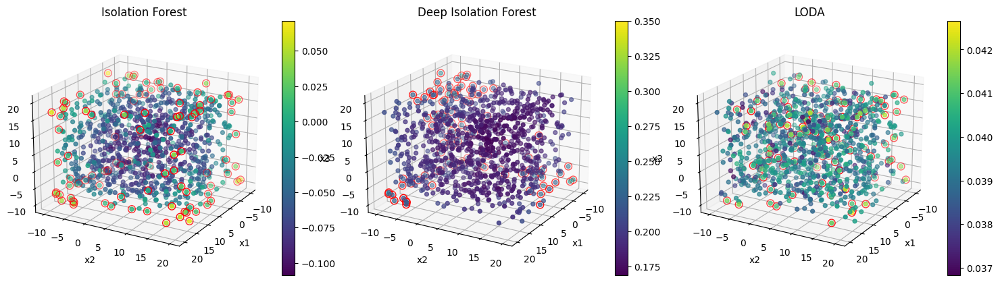

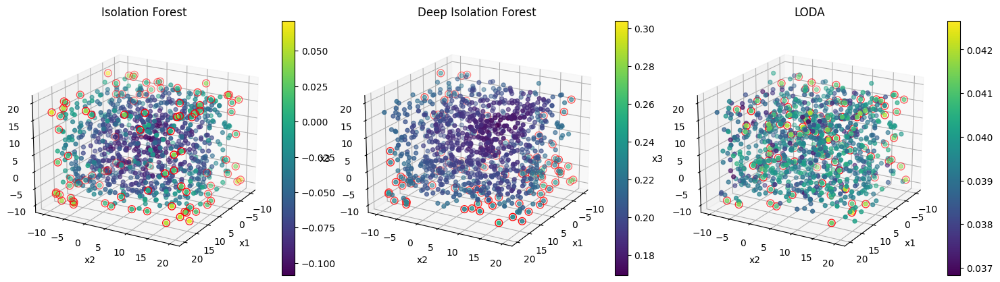

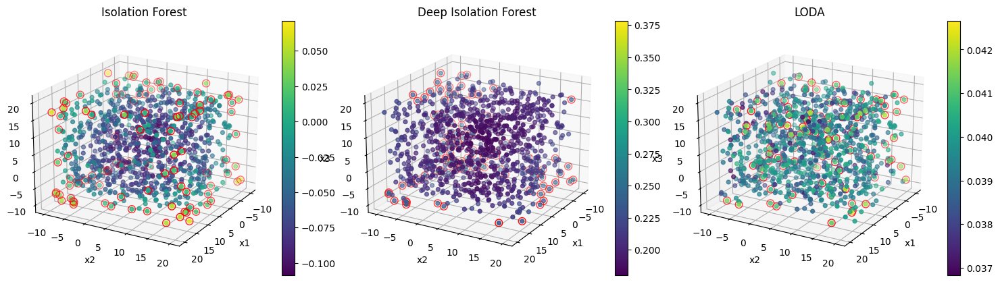

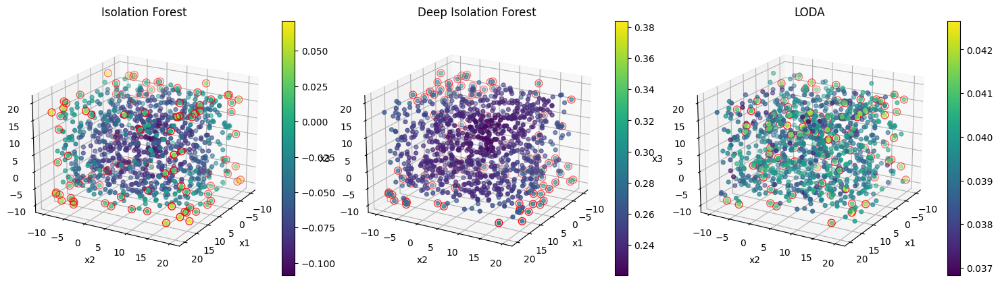

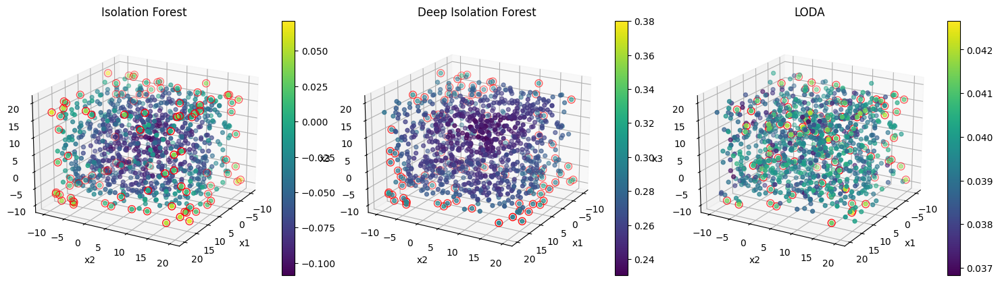

In [28]:
X3, y3 = make_blobs(n_samples=[500, 500], n_features=3,
                    centers=[[0, 10, 0], [10, 0, 0]],
                    cluster_std=1.0, random_state=42, shuffle=True)

X_test3 = np.random.uniform(-10, 20, size=(1000, 3))

def train_models_3d(X_train, hidden_neurons, n_bins):
    # Isolation Forest
    clf = IForest(contamination=0.1, random_state=30)
    clf.fit(X_train)
    scores_if_3 = clf.decision_function(X_test3)

    # Deep Isolation Forest
    dif =DIF(contamination=0.1, random_state=30, hidden_neurons=hidden_neurons)
    dif.fit(X_train)
    scores_dif_3 = dif.decision_function(X_test3)

    # LODA
    loda = LODA(contamination=0.1, n_bins=n_bins)
    loda.fit(X_train)
    scores_loda_3 = loda.decision_function(X_test3)

    models_3d = [
        ("Isolation Forest", scores_if_3),
        ("Deep Isolation Forest", scores_dif_3),
        ("LODA", scores_loda_3),
    ]

    fig = plt.figure(figsize=(18, 6))
    for i, (title, scores) in enumerate(models_3d, start=1):
        ax = fig.add_subplot(1, 3, i, projection="3d")
        sc = ax.scatter(X_test3[:, 0], X_test3[:, 1], X_test3[:, 2],
                        c=scores, cmap="viridis", s=18)
        thr = np.nanpercentile(scores, 90)
        mask_an = scores >= thr
        ax.scatter(X_test3[mask_an, 0], X_test3[mask_an, 1], X_test3[mask_an, 2],
                facecolors='none', edgecolors='r', s=60, linewidth=1, label='top 10% anomalies')
        ax.set_title(title)
        ax.set_xlabel("x1"); ax.set_ylabel("x2"); ax.set_zlabel("x3")
        ax.view_init(elev=20, azim=30)
        plt.colorbar(sc, ax=ax, fraction=0.046, pad=0.04)
    

train_models_3d(X_test3, hidden_neurons=[20, 10], n_bins=10) 
train_models_3d(X_test3, hidden_neurons=[20, 10], n_bins=50)
train_models_3d(X_test3, hidden_neurons=[20, 10], n_bins=200)

train_models_3d(X_test3, hidden_neurons=[20], n_bins=50)
train_models_3d(X_test3, hidden_neurons=[20, 10, 5], n_bins=50)
train_models_3d(X_test3, hidden_neurons=[50, 25, 10, 5], n_bins=50)

train_models_3d(X_test3, hidden_neurons=[10, 5], n_bins=50)
train_models_3d(X_test3, hidden_neurons=[50, 25], n_bins=50)
train_models_3d(X_test3, hidden_neurons=[100, 50], n_bins=50)

The principles governing the hyperparameters of LODA and DIF remain consistent when moving from 2D to 3D. However, the increased dimensionality underscores the value of these advanced methods. LODA provides a robust density estimation in a sparser space, while DIF's use of complex, non-linear projections becomes an even more powerful tool for overcoming the challenges of the curse of dimensionality, allowing it to identify anomalies that a simpler model might miss.

### 2.3 Ex. 3

1. For this exercise you will need to shuttle datasets from [ODDS](https://odds.cs.stonybrook.edu/shuttle-dataset/). Load the data using **scipy.io.loadmat()** and use **train_test_split()** to split it into train and test subjects (use $40\%$ of the data for testing). Normalize the data accordinly.

In [33]:
import numpy as np

from scipy.io import loadmat
from sklearn.model_selection import train_test_split
from pyod.utils.utility import standardizer

mat_path = "data/shuttle.mat"

# Path to the downloaded shuttle .mat file (change if needed)
mat = loadmat(mat_path)
X = mat['X']
y = mat['y'].ravel()
print("Raw shapes -> X:", X.shape, "y:", y.shape)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.4, random_state=42, stratify=y
)

X_train_norm, X_test_norm = standardizer(X_train, X_test)

print("Train shape:", X_train_norm.shape, "Test shape:", X_test_norm.shape)
print("Train label counts:", np.bincount(y_train), "Test label counts:", np.bincount(y_test))

Raw shapes -> X: (49097, 9) y: (49097,)
Train shape: (29458, 9) Test shape: (19639, 9)
Train label counts: [27351  2107] Test label counts: [18235  1404]


2. For IForest, LODA and DIF using the training data and compute the balanced accuracy score (**BA**) and the area under the curve (**ROC AUC** using **sklearn.metrics.roc_auc_score**). for each model. Computes the mean **BA** and **ROC AUC** obtained for 10 different train-test splits for each model.

In [34]:
from sklearn.metrics import balanced_accuracy_score, roc_auc_score
import numpy as np

n_splits = 10
contamination = 0.1

ba_if, auc_if = [], []
ba_dif, auc_dif = [], []
ba_loda, auc_loda = [], []

for seed in range(n_splits):
    # split and standardize (X, y are defined in a previous cell)
    X_tr, X_te, y_tr, y_te = train_test_split(X, y, test_size=0.4, random_state=seed, stratify=y)
    X_tr_norm, X_te_norm = standardizer(X_tr, X_te)

    # IForest
    clf_if = IForest(contamination=contamination, random_state=seed)
    clf_if.fit(X_tr_norm)
    scores_if = clf_if.decision_function(X_te_norm)
    thr_if = np.nanpercentile(scores_if, 100 * (1 - contamination))
    y_pred_if = (scores_if >= thr_if).astype(int)
    ba_if.append(balanced_accuracy_score(y_te, y_pred_if))
    auc_if.append(roc_auc_score(y_te, scores_if))

    # Deep Isolation Forest
    clf_dif = DIF(contamination=contamination, random_state=seed)
    clf_dif.fit(X_tr_norm)
    scores_dif = clf_dif.decision_function(X_te_norm)
    thr_dif = np.nanpercentile(scores_dif, 100 * (1 - contamination))
    y_pred_dif = (scores_dif >= thr_dif).astype(int)
    ba_dif.append(balanced_accuracy_score(y_te, y_pred_dif))
    auc_dif.append(roc_auc_score(y_te, scores_dif))

    # LODA
    clf_loda = LODA(contamination=contamination)
    clf_loda.fit(X_tr_norm)
    scores_loda = clf_loda.decision_function(X_te_norm)
    thr_loda = np.nanpercentile(scores_loda, 100 * (1 - contamination))
    y_pred_loda = (scores_loda >= thr_loda).astype(int)
    ba_loda.append(balanced_accuracy_score(y_te, y_pred_loda))
    auc_loda.append(roc_auc_score(y_te, scores_loda))

# report mean (and std)
def report(name, ba_list, auc_list):
    print(f"{name}: BA mean={np.mean(ba_list):.4f}  BA std={np.std(ba_list):.4f} | ROC AUC mean={np.mean(auc_list):.4f}  ROC AUC std={np.std(auc_list):.4f}")

report("Isolation Forest", ba_if, auc_if)
report("Deep Isolation Forest", ba_dif, auc_dif)
report("LODA", ba_loda, auc_loda)

Isolation Forest: BA mean=0.9761  BA std=0.0023 | ROC AUC mean=0.9969  ROC AUC std=0.0010
Deep Isolation Forest: BA mean=0.9316  BA std=0.0461 | ROC AUC mean=0.9720  ROC AUC std=0.0055
LODA: BA mean=0.6543  BA std=0.1586 | ROC AUC mean=0.7132  ROC AUC std=0.2823
